# Performance Tests of Dask-Based DC2 Run 1.1 Object Catalog Access
Owners: **Michael Wood-Vasey [@wmwv](https://github.com/LSSTDESC/DC2_Repo/issues/new?body=@wmwv)**  
Last Run: **2018-10-06**

Test the Dask performance of data manipulations of the static coadd catalogs.


Logistics:

1. These tests were conducted on NERSC through the https://jupyter-dev.nersc.gov interface.

2. Requires:
```
graphviz
bokeh
```
These were pip-installed locally with `--user`.

3. This was run using a custom kernel specification
/global/homes/w/wmwv/.local/share/jupyter/kernels/desc-python-dask
  - This custom kernel specification was used to control the OMP_NUM_THREADS setting.
  - Tests were runing with both `OMP_NUM_THREADS=4` and `OMP_NUM_THREADS=24`.

## How fast is Dask?

In [1]:
import os

import numpy as np

In [2]:
from bokeh.io import output_notebook

In [3]:
import dask as da
import dask.dataframe as dd

We'l first use the `dask.distributed` scheduler:
http://docs.dask.org/en/latest/scheduling.html#dask-distributed-local

In [4]:
from dask.distributed import Client
client = Client(processes=False)

In [5]:
tract = 4850

base_dir = '/global/projecta/projectdirs/lsst/global/in2p3/Run1.1/summary'

datafile = os.path.join(base_dir, 'table_trim_merged_tract_%d.hdf5' % tract)
datafile_pattern = os.path.join(base_dir, 'table_trim_merged_tract_*.hdf5')

Now we load the data files into Dask dataframes.

We set up a context manager to suppress warnings when we read because there's a FutureWarning with the dask package when concatinating data sets of different sizes.  This triggers in our case because some of the HDFs have different number of columns because of missing filters.

In [6]:
import warnings

with warnings.catch_warnings():
    warnings.simplefilter('ignore')
    da_df = dd.read_hdf(datafile, key='coadd_*', mode='r')
    da_df_all = dd.read_hdf(datafile_pattern, key='coadd_*', mode='r')

In [7]:
df2 = np.mean(da_df['g_mag'] - da_df['r_mag'])
df2_all = np.mean(da_df_all['g_mag'] - da_df_all['r_mag'])

In [8]:
print("One tract DataFrame has length:", len(da_df))
print("All tracts DataFrame has length:", len(da_df_all))

One tract DataFrame has length: 719228
All tracts DataFrame has length: 6892380


Note the above `len` commands took 3 seconds and 1 minute to run, respectively.  To calculate the length, Dask has to go through all of the rows.  This gives us the rought timescales for how long it will take to do any of the computations.

In [9]:
%%timeit
df2.compute()

2.89 s ± 118 ms per loop (mean ± std. dev. of 7 runs, 1 loop each)


In [10]:
%%timeit
df2_all.compute()

52.6 s ± 1.42 s per loop (mean ± std. dev. of 7 runs, 1 loop each)


Note that the full DASK calculation takes 20 times longer than the onetract Dask calculation for a data volume only 10-times larger.  We're potentially hitting memory limits, but there also might be some inefficiencies.  It's also possible that we need to calculate something harder before we see gains.

DASK takes ~38 seconds to do the color average using the `table_trim_` file, while GCRCatalogs takes ~12 seconds using the `trim_` file.

It doesn't matter if we have OMP_NUM_THREADS at 4 or 24, the performance is still ~60 seconds for the full `df2_all.compute()`

In [11]:
import os
print(os.getenv('OMP_NUM_THREADS'))

4


### Workflow Plan and Performance Charts

Here we look into the profiling of the Dask jobs to understand the workflow graph and then the overal performance (CPU, memory, wall clock time) for several different Dask schedulers:
1. `dask.distributed`
2. `multiprocess`
3. `threads`

The `dask.distributed` library is an additional effort originally designed to work on distributed Dask analysis, but it turns out it's often the best choice for local operations as well.  We'll see below that `dask.distributed` is significantly faster than either `multiprocess` or `threads`.

Read more at  
https://distributed.dask.org/en/latest/  
https://docs.dask.org/en/latest/scheduling.html

In [12]:
# Load Bokeh into the Notebook
output_notebook()

Loading BokehJS ...

In [13]:
from dask.diagnostics import Profiler, ResourceProfiler, CacheProfiler, visualize

### We're first using the Dask `distributed` scheduler.

In [14]:
da.config.config['scheduler']

'dask.distributed'

In [15]:
with da.config.set(scheduler='dask.distributed'), \
        Profiler() as prof, \
        ResourceProfiler(dt=0.25) as rprof, \
        CacheProfiler() as cprof:
    result = df2_all.compute()

In [16]:
prof.results

[]

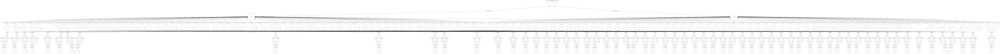

In [17]:
df2.visualize(format='svg')

The above graph is very large.  You're welcome to scroll until you get tired.  But it's all the same low-level help of reading a particular chunk (`_pd_read_hdf`->`('read-hdf-#40',0)`->`(concat-#7', 33)`, getting the columns (`getitem`->`('getitem-#5', 33)`, `('getitem-#4', 33)`), subtracting them (`sub`, `('sub-#3', 33)`), accumulating the results in a series (`_reduction_chunk`, `('series-count-chunk#1', 0, 33, 0)`, and then averaging the series across all of the chunks (`_reduction_aggregate`).

In [18]:
visualize([prof, rprof, cprof])

bokeh.models.layouts.Column(
    id='1b3cdf27-7261-47fd-8ced-5e5c7639ebbb',
    children=[bokeh.models.tools.ToolbarBox(
         id='075c4de4-18ad-44ba-bc71-a373f8d354b8',
         css_classes=[],
         disabled=False,
         height=None,
         js_event_callbacks={},
         js_property_callbacks={},
         name=None,
         sizing_mode='fixed',
         subscribed_events=[],
         tags=[],
         toolbar=bokeh.models.tools.ProxyToolbar(
             id='b1c3e817-23d7-4ea8-87de-d2e270056045',
             js_event_callbacks={},
             js_property_callbacks={},
             logo='normal',
             name=None,
             subscribed_events=[],
             tags=[],
             tools=[bokeh.models.tools.HoverTool(
                  id='8348de45-1f91-4178-aff0-caae67a1b9fe',
                  anchor='center',
                  attachment='horizontal',
                  callback=None,
                  formatters={},
                  js_event_callbacks={},
                  js_property_callbacks={},
                  line_policy='nearest',
                  mode='mouse',
                  name=None,
                  names=[],
                  point_policy='follow_mouse',
                  renderers='auto',
                  show_arrow=True,
                  subscribed_events=[],
                  tags=[],
                  toggleable=True,
                  tooltips='\n    <div>\n        <span style="font-size: 14px; font-weight: bold;">Key:</span>&nbsp;\n        <span style="font-size: 10px; font-family: Monaco, monospace;">@key</span>\n    </div>\n    <div>\n        <span style="font-size: 14px; font-weight: bold;">Task:</span>&nbsp;\n        <span style="font-size: 10px; font-family: Monaco, monospace;">@function</span>\n    </div>\n    '),
              bokeh.models.tools.SaveTool(
                  id='1d19b36a-bcbb-4198-b742-9f6c781185d8',
                  js_event_callbacks={},
                  js_property_callbacks={},
                  name=None,
                  subscribed_events=[],
                  tags=[]),
              bokeh.models.tools.ResetTool(
                  id='0521eac5-1364-4dc6-8f04-6cdf7d0bd4cc',
                  js_event_callbacks={},
                  js_property_callbacks={},
                  name=None,
                  subscribed_events=[],
                  tags=[]),
              bokeh.models.tools.WheelZoomTool(
                  id='9771d775-fbb6-43b4-b900-03a21f474ac6',
                  dimensions='width',
                  js_event_callbacks={},
                  js_property_callbacks={},
                  maintain_focus=True,
                  name=None,
                  speed=0.0016666666666666668,
                  subscribed_events=[],
                  tags=[],
                  zoom_on_axis=True),
              bokeh.models.tools.PanTool(
                  id='2e83c1d2-b725-4412-bb07-3c2237797947',
                  dimensions='width',
                  js_event_callbacks={},
                  js_property_callbacks={},
                  name=None,
                  subscribed_events=[],
                  tags=[]),
              bokeh.models.tools.SaveTool(
                  id='e49f46bc-edda-48c2-b406-b8f1fa6b804e',
                  js_event_callbacks={},
                  js_property_callbacks={},
                  name=None,
                  subscribed_events=[],
                  tags=[]),
              bokeh.models.tools.ResetTool(
                  id='3b97bd65-ea92-401e-882c-4f293f9e7d4d',
                  js_event_callbacks={},
                  js_property_callbacks={},
                  name=None,
                  subscribed_events=[],
                  tags=[]),
              bokeh.models.tools.WheelZoomTool(
                  id='73a44081-0fce-4c78-8ef0-480a6f8b199e',
                  dimensions='width',
                  js_event_callbacks={},
                  js_property_callbacks={},
                  maintain_focus=True,
     

The above profile for the default `dask.distributed` scheduler looks quite reasonable.  10 seconds, 5 GB memory, 100 CPU usage for those 10 seconds.

### Next we'll try the multiprocessing scheduler:
with 8 workers.

In [19]:
import dask.multiprocessing

In [20]:
with dask.config.set(scheduler='processes'), \
        Profiler() as new_prof, \
        ResourceProfiler(dt=0.25) as new_rprof, \
        CacheProfiler() as new_cprof:
    result = df2_all.compute(num_workers=8)

In [21]:
visualize([new_prof, new_rprof, new_cprof])

bokeh.models.layouts.Column(
    id='e95e1607-6584-4892-b70b-e5a181696e52',
    children=[bokeh.models.tools.ToolbarBox(
         id='14594ee9-f831-4f4d-903e-e655e145bf2e',
         css_classes=[],
         disabled=False,
         height=None,
         js_event_callbacks={},
         js_property_callbacks={},
         name=None,
         sizing_mode='fixed',
         subscribed_events=[],
         tags=[],
         toolbar=bokeh.models.tools.ProxyToolbar(
             id='67c8bb0e-36de-449e-9160-e310acc8494a',
             js_event_callbacks={},
             js_property_callbacks={},
             logo='normal',
             name=None,
             subscribed_events=[],
             tags=[],
             tools=[bokeh.models.tools.HoverTool(
                  id='d0c5e885-1711-476e-a49e-55592bbaa548',
                  anchor='center',
                  attachment='horizontal',
                  callback=None,
                  formatters={},
                  js_event_callbacks={},
                  js_property_callbacks={},
                  line_policy='nearest',
                  mode='mouse',
                  name=None,
                  names=[],
                  point_policy='follow_mouse',
                  renderers='auto',
                  show_arrow=True,
                  subscribed_events=[],
                  tags=[],
                  toggleable=True,
                  tooltips='\n    <div>\n        <span style="font-size: 14px; font-weight: bold;">Key:</span>&nbsp;\n        <span style="font-size: 10px; font-family: Monaco, monospace;">@key</span>\n    </div>\n    <div>\n        <span style="font-size: 14px; font-weight: bold;">Task:</span>&nbsp;\n        <span style="font-size: 10px; font-family: Monaco, monospace;">@function</span>\n    </div>\n    '),
              bokeh.models.tools.SaveTool(
                  id='2952f25a-11ff-4711-a7af-64a24caf67d7',
                  js_event_callbacks={},
                  js_property_callbacks={},
                  name=None,
                  subscribed_events=[],
                  tags=[]),
              bokeh.models.tools.ResetTool(
                  id='63dc3d64-0034-4a74-baa9-c6b2ab6eeadb',
                  js_event_callbacks={},
                  js_property_callbacks={},
                  name=None,
                  subscribed_events=[],
                  tags=[]),
              bokeh.models.tools.WheelZoomTool(
                  id='bacc9427-3736-4488-9590-b64ef887fc57',
                  dimensions='width',
                  js_event_callbacks={},
                  js_property_callbacks={},
                  maintain_focus=True,
                  name=None,
                  speed=0.0016666666666666668,
                  subscribed_events=[],
                  tags=[],
                  zoom_on_axis=True),
              bokeh.models.tools.PanTool(
                  id='55c5db67-a755-4d56-8855-8122e1e3933c',
                  dimensions='width',
                  js_event_callbacks={},
                  js_property_callbacks={},
                  name=None,
                  subscribed_events=[],
                  tags=[]),
              bokeh.models.tools.SaveTool(
                  id='bee8b0d0-5479-4a86-8f2b-50fa31516d56',
                  js_event_callbacks={},
                  js_property_callbacks={},
                  name=None,
                  subscribed_events=[],
                  tags=[]),
              bokeh.models.tools.ResetTool(
                  id='325e16fe-186d-4ac8-8d93-ca3d58c41e85',
                  js_event_callbacks={},
                  js_property_callbacks={},
                  name=None,
                  subscribed_events=[],
                  tags=[]),
              bokeh.models.tools.WheelZoomTool(
                  id='bc6d5420-1bd2-4bcc-9e8b-bf6276bac382',
                  dimensions='width',
                  js_event_callbacks={},
                  js_property_callbacks={},
                  maintain_focus=True,
     

That `scheduler='processes'` is not very good.  It takes 290 seconds, 36 GB across 8 workers, and has significant simultaneous CPU bursts on top of steady-state 100-200% CPU usage.

You can mouse-over the top row to see what each worker is spending its time doing across those 300 seconds.

### Next let's try the 'threads' scheduler
with 8 workers

In [22]:
with dask.config.set(scheduler='threads'), \
        Profiler() as thread_8_prof, \
        ResourceProfiler(dt=0.25) as thread_8_rprof, \
        CacheProfiler() as thread_8_cprof:
    thread_8_result = df2_all.compute(num_workers=8)

In [23]:
visualize([thread_8_prof, thread_8_rprof, thread_8_cprof])

bokeh.models.layouts.Column(
    id='815c7237-f2da-42c0-91fd-d2070123408e',
    children=[bokeh.models.tools.ToolbarBox(
         id='9d1f6a47-ba8b-4d5f-86c4-1e50f74ed48e',
         css_classes=[],
         disabled=False,
         height=None,
         js_event_callbacks={},
         js_property_callbacks={},
         name=None,
         sizing_mode='fixed',
         subscribed_events=[],
         tags=[],
         toolbar=bokeh.models.tools.ProxyToolbar(
             id='9ff5d403-0a3f-4d59-b818-83629a13b3c7',
             js_event_callbacks={},
             js_property_callbacks={},
             logo='normal',
             name=None,
             subscribed_events=[],
             tags=[],
             tools=[bokeh.models.tools.HoverTool(
                  id='70504637-5338-4081-a7d3-53581d7066fa',
                  anchor='center',
                  attachment='horizontal',
                  callback=None,
                  formatters={},
                  js_event_callbacks={},
                  js_property_callbacks={},
                  line_policy='nearest',
                  mode='mouse',
                  name=None,
                  names=[],
                  point_policy='follow_mouse',
                  renderers='auto',
                  show_arrow=True,
                  subscribed_events=[],
                  tags=[],
                  toggleable=True,
                  tooltips='\n    <div>\n        <span style="font-size: 14px; font-weight: bold;">Key:</span>&nbsp;\n        <span style="font-size: 10px; font-family: Monaco, monospace;">@key</span>\n    </div>\n    <div>\n        <span style="font-size: 14px; font-weight: bold;">Task:</span>&nbsp;\n        <span style="font-size: 10px; font-family: Monaco, monospace;">@function</span>\n    </div>\n    '),
              bokeh.models.tools.SaveTool(
                  id='583a5989-8ebe-4ea9-af81-ad2883d6c2a6',
                  js_event_callbacks={},
                  js_property_callbacks={},
                  name=None,
                  subscribed_events=[],
                  tags=[]),
              bokeh.models.tools.ResetTool(
                  id='ec6a24b0-5675-4aa3-8460-6984fc5c8096',
                  js_event_callbacks={},
                  js_property_callbacks={},
                  name=None,
                  subscribed_events=[],
                  tags=[]),
              bokeh.models.tools.WheelZoomTool(
                  id='6c0e23e7-8992-4ed0-a24c-7fee752f19ed',
                  dimensions='width',
                  js_event_callbacks={},
                  js_property_callbacks={},
                  maintain_focus=True,
                  name=None,
                  speed=0.0016666666666666668,
                  subscribed_events=[],
                  tags=[],
                  zoom_on_axis=True),
              bokeh.models.tools.PanTool(
                  id='8a3bba23-001a-4669-aae1-48c786ecc002',
                  dimensions='width',
                  js_event_callbacks={},
                  js_property_callbacks={},
                  name=None,
                  subscribed_events=[],
                  tags=[]),
              bokeh.models.tools.SaveTool(
                  id='469515a9-678b-437b-9af4-b1563695a160',
                  js_event_callbacks={},
                  js_property_callbacks={},
                  name=None,
                  subscribed_events=[],
                  tags=[]),
              bokeh.models.tools.ResetTool(
                  id='18f5460f-1ac4-4b04-8cc5-045795964e9d',
                  js_event_callbacks={},
                  js_property_callbacks={},
                  name=None,
                  subscribed_events=[],
                  tags=[]),
              bokeh.models.tools.WheelZoomTool(
                  id='276dda9a-2876-4c9d-9f4f-5a2658cd96f5',
                  dimensions='width',
                  js_event_callbacks={},
                  js_property_callbacks={},
                  maintain_focus=True,
     

Let's explicitly time the performance over repeated runs using `%%timeit`.

In [24]:
%%timeit
with dask.config.set(scheduler='threads', num_workers=8), \
        Profiler(), \
        ResourceProfiler(dt=0.25), \
        CacheProfiler():
    _ = df2_all.compute()

36 s ± 1 s per loop (mean ± std. dev. of 7 runs, 1 loop each)


The `scheduler='threads'` scheduler takes 11 GB memory usage.  Constant CPU usage ~120%.  This is much better than `scheduler='processes'`. 

But the `dask.distributed` scheduler is still 3-4 faster and uses half as much memory.

### Does it matter if we're on Lustre (SCRATCH)

No.

In [25]:
base_dir = '/global/cscratch1/sd/wmwv/DC2/Run1.1p/summary'

datafile_lustre = os.path.join(base_dir, 'table_trim_merged_tract_%d.hdf5' % tract)
datafile_pattern_lustre = os.path.join(base_dir, 'table_trim_merged_tract_*.hdf5')

In [26]:
da_df_lustre = dd.read_hdf(datafile_lustre, key='coadd_*', mode='r')
da_df_all_lustre = dd.read_hdf(datafile_pattern_lustre, key='coadd_*', mode='r')

In [27]:
df2_lustre = np.mean(da_df_lustre['g_mag'] - da_df_lustre['r_mag'])
df2_all_lustre = np.mean(da_df_all_lustre['g_mag'] - da_df_all_lustre['r_mag'])

In [28]:
%%timeit
df2_lustre.compute()

3.15 s ± 303 ms per loop (mean ± std. dev. of 7 runs, 1 loop each)


In [29]:
%%timeit
df2_all_lustre.compute()

57 s ± 2.46 s per loop (mean ± std. dev. of 7 runs, 1 loop each)


Time on the Luster file system (2, 42) sec seems about the same as the GPFS (2, 50) sec.

### Questions for Future Investigation
1. Does it matter if we're on the burst buffer?
2. Testing of setting up a job with a cluster of workers.
    - The efforts I tried were relatively fragile and involved.
3. Are we using OMP_NUM_THREADS efficiently/correctly in Dask/Pandas?
4. How does Dask perform using Parquet files?